In [72]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely import geometry
import rioxarray as rxr
from rasterio.features import shapes
import osmnx as ox
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import contextily as cx
from MODE_top_level import RegionalModel
from syspy.spatial.spatial import agglomerative_clustering, zone_clusters

In [2]:
figsize = 16

# Create a regional model

Define the region and generate networks

In [3]:
region_name = 'Seville'
west, south, east, north = -6.023388,37.307,-5.894325,37.438819
polygon = geometry.Polygon([(west, south), (east, south), (east, north), (west, north), (west, south)])
regio_df = gpd.GeoDataFrame(index=['city'], geometry=[polygon], crs=4326)
buffer = 0.01
# Init a regional model with quetzal properties
model = RegionalModel(polygon=polygon, buffer_size=buffer, epsg=4326, coordinates_unit='degree')

In [7]:
# Add functional urban area
fua_url = 'https://jeodpp.jrc.ec.europa.eu/ftp/jrc-opendata/GHSL/GHS_FUA_UCDB2015_GLOBE_R2019A/V1-0/GHS_FUA_UCDB2015_GLOBE_R2019A_54009_1K_V1_0.zip'
p = f"zip+{fua_url}!GHS_FUA_UCDB2015_GLOBE_R2019A_54009_1K_V1_0.gpkg"
fuas = gpd.read_file(p)
fua = fuas.query(f"eFUA_name == '{region_name}'").to_crs(regio_df.crs)
regio_df.loc['fua'] = fua.iloc[0,-1]

In [ ]:
# Save the geometry
if not os.path.exists('../model/'+region_name+'/'):
    os.mkdir('../model/'+region_name+'/')
    os.mkdir('../output/'+region_name+'/')
regio_df.to_file('../model/'+region_name+'/region_geometries.geojson', driver='GeoJSON')

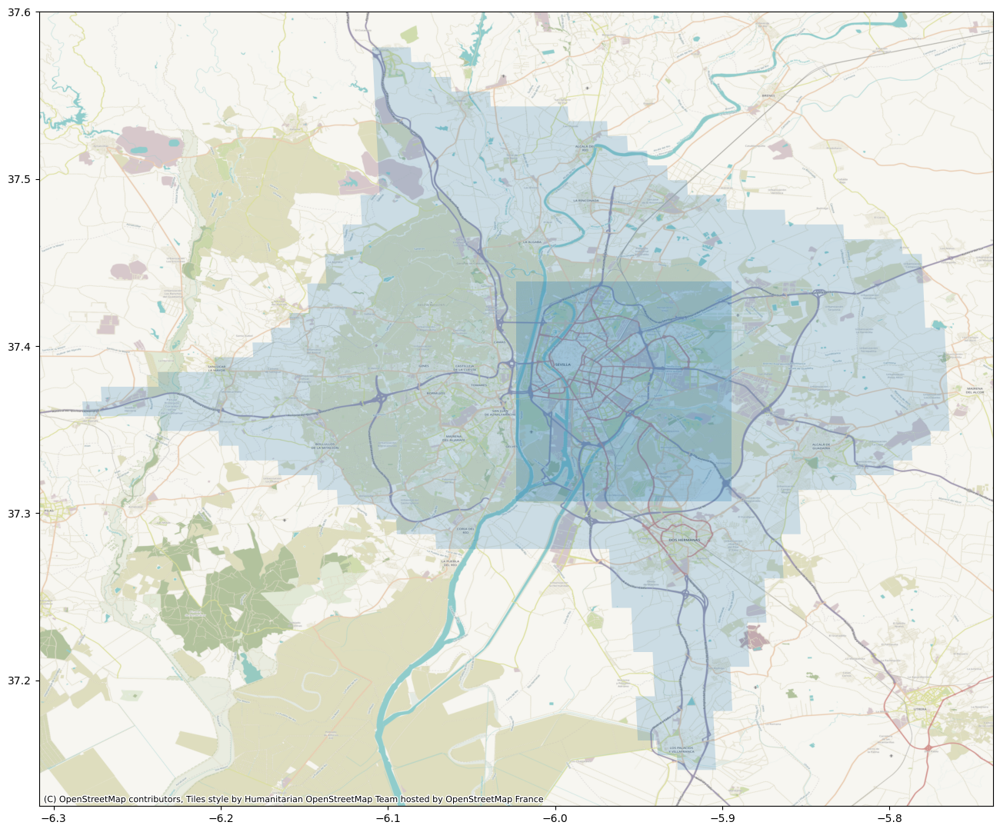

In [8]:
# Plot
regio_df['alpha'] = [1/(i+4) for i in range(len(regio_df))]
plot = regio_df.plot(alpha=regio_df['alpha'], figsize=(figsize, figsize))
cx.add_basemap(ax=plot, crs='EPSG:4326', zoom=13)#, source=cx.providers.OpenStreetMap.Mapnik)
plot.figure.savefig('../output/'+region_name+'/region.png', dpi=400, bbox_inches='tight')

# Road network

Driving, cycling, and walking

In [9]:
# Generate road networks
road_path = '../model/'+region_name+'/networks_road/'
if not os.path.exists(road_path):
    model.generate_street_networks(
        path_to_graphml='../input/OSM_region_'+region_name+'.graphml',
        car=True, bike=True, walk=True,
        bikeable=['designated', 'road_markings', 'small_road', 'path', 'main_road', 'with_foot', 'primary'],
        walkable=['designated', 'on_street', 'unknown'], # main_road
        simplify_strict=False)
    model.save_networks_road(road_path)
else:
    model.load_networks_road(road_path)

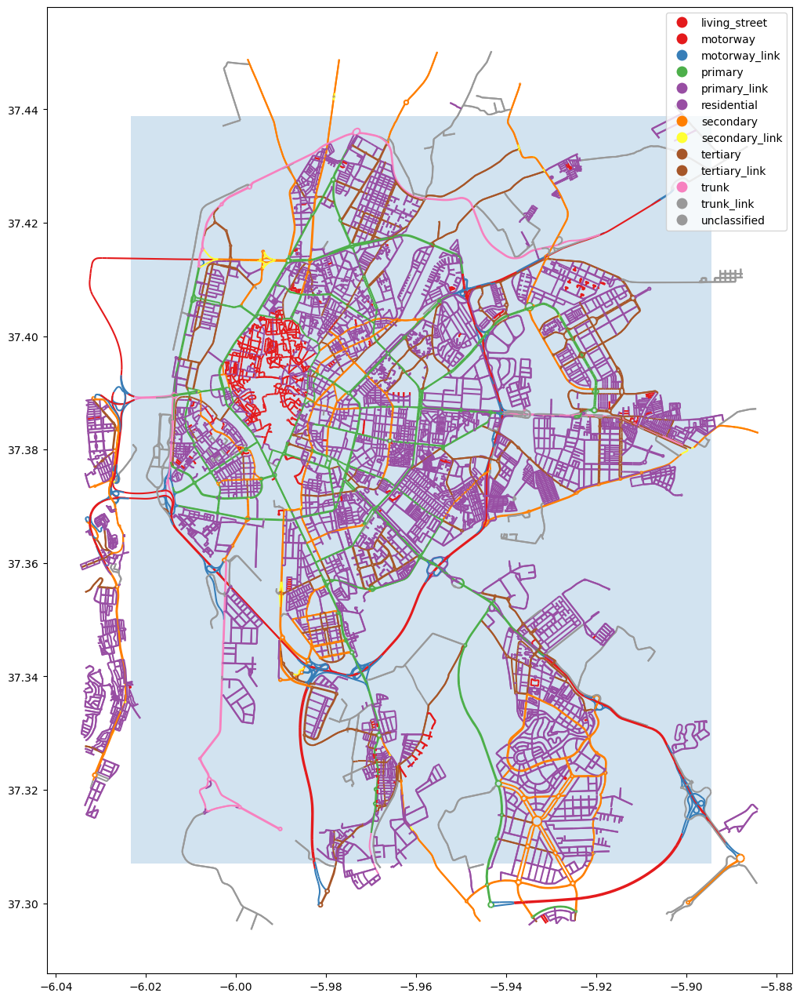

In [17]:
model.auto_links.plot(column='highway', cmap='Set1', legend=True, ax=regio_df.loc[['city']].plot(alpha=0.2, figsize=(figsize, figsize)))
#plt.xlim(west, east)
#plt.ylim(south, north)
plt.savefig('../output/'+region_name+'/network_car.png', dpi=400, bbox_inches='tight')

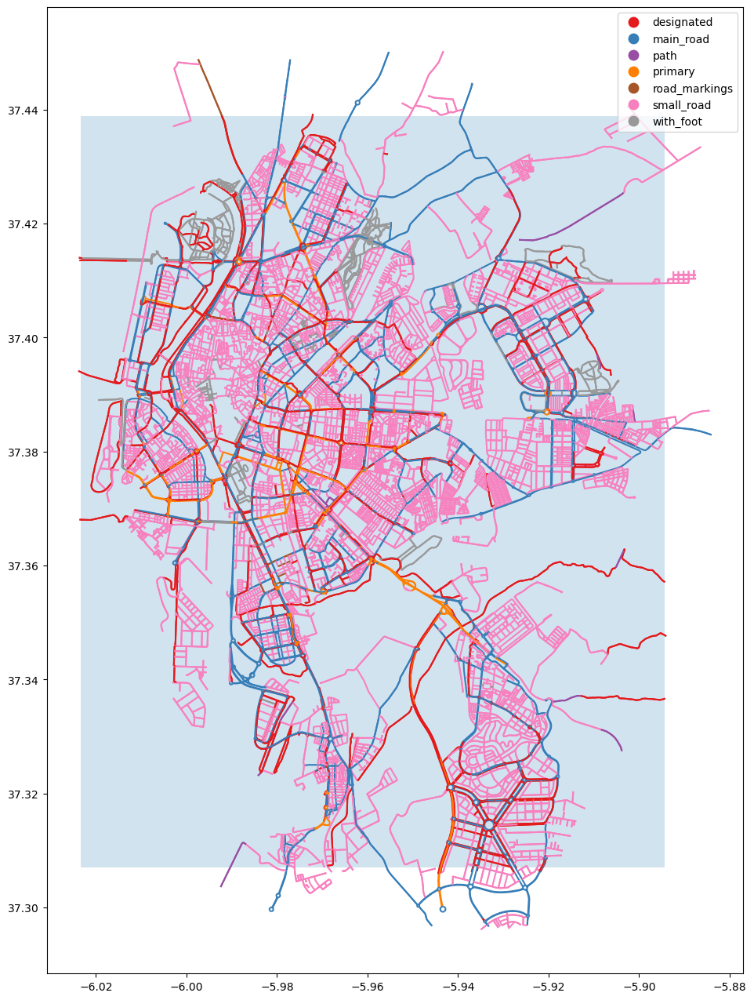

In [18]:
model.cycle_links.plot(column='way_quality', cmap='Set1', legend=True, ax=regio_df.loc[['city']].plot(alpha=0.2, figsize=(figsize, figsize)))
#plt.xlim(west, east)
#plt.ylim(south, north)
plt.savefig('../output/'+region_name+'/network_bicycle.png', dpi=400, bbox_inches='tight')

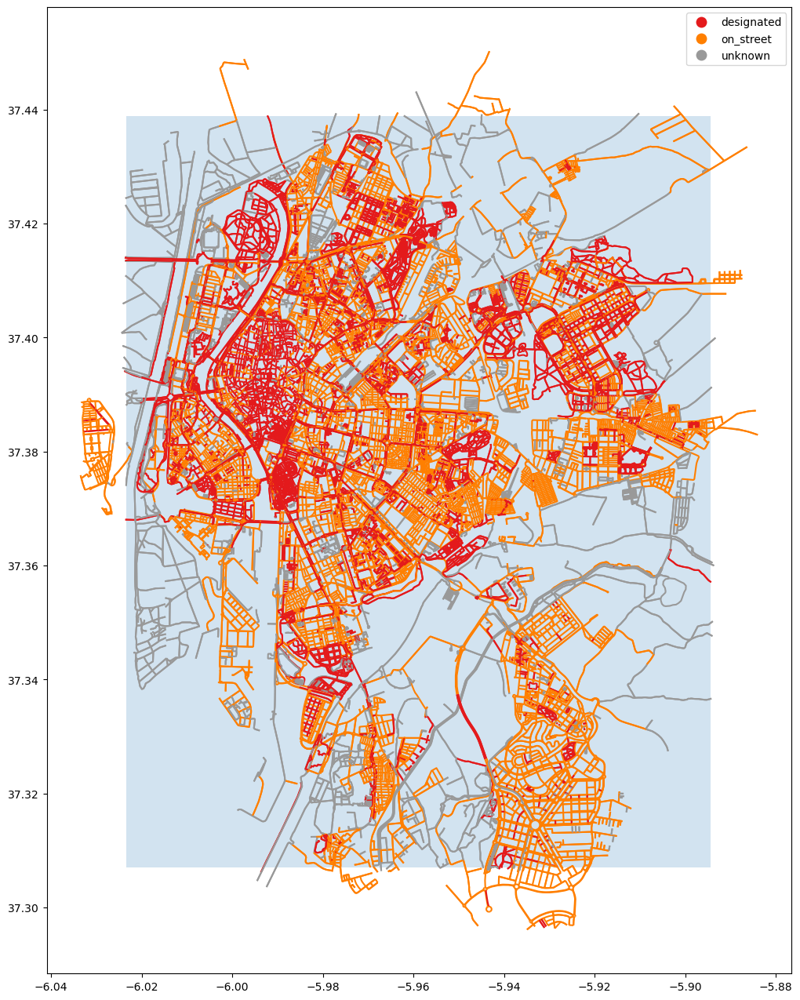

In [19]:
model.walk_links.plot(column='footway_class', cmap='Set1', legend=True, ax=regio_df.loc[['city']].plot(alpha=0.2, figsize=(figsize, figsize)))
#plt.xlim(west, east)
#plt.ylim(south, north)
plt.savefig('../output/'+region_name+'/network_walk.png', dpi=400, bbox_inches='tight')

# Public transit network

Generate pt_links and pt_nodes, also relevant for P&R pathfinding.

In [13]:
# Generate
pt_path = '../model/'+region_name+'/networks_pt/'
if not os.path.exists(pt_path):
    gtfs_path = '../input/'+region_name+'/GTFS/'
    route_type_dict = {1: 'metro', 3: 'bus'}
    for file in os.listdir(gtfs_path):
        print(file)
        dates = None
        if 'Andalusia_buses' in file:
            dates = [str(d) for d in range(20260309, 20260316)]
        elif file.startswith('Sevilla'):
            dates = [str(d) for d in range(20260108, 20260112)]
        model.generate_public_transport_network(gtfs_path+str(file),
                                                dates=dates,
                                                route_type_dict=route_type_dict,
                                                remote_stations_for_headway=False,
                                                fix_integrity=False,
                                                max_shortcut=1000)
    # Save PT networks
    model.save_network_pt(pt_path.replace('_pt/', '_pt_no_integrity/'))
    # Then perform integrity checks
    model.fix_pt_network_integrity()
    # Fix the broken GTFS times
    model.pt_links.loc[(model.pt_links['trip_id'].str.startswith('2')), 'time'] = \
        model.pt_links.loc[(model.pt_links['trip_id'].str.startswith('2')), 'length'] / (30/3.6)
    model.save_network_pt(pt_path)
else:
    model.load_network_pt(pt_path)

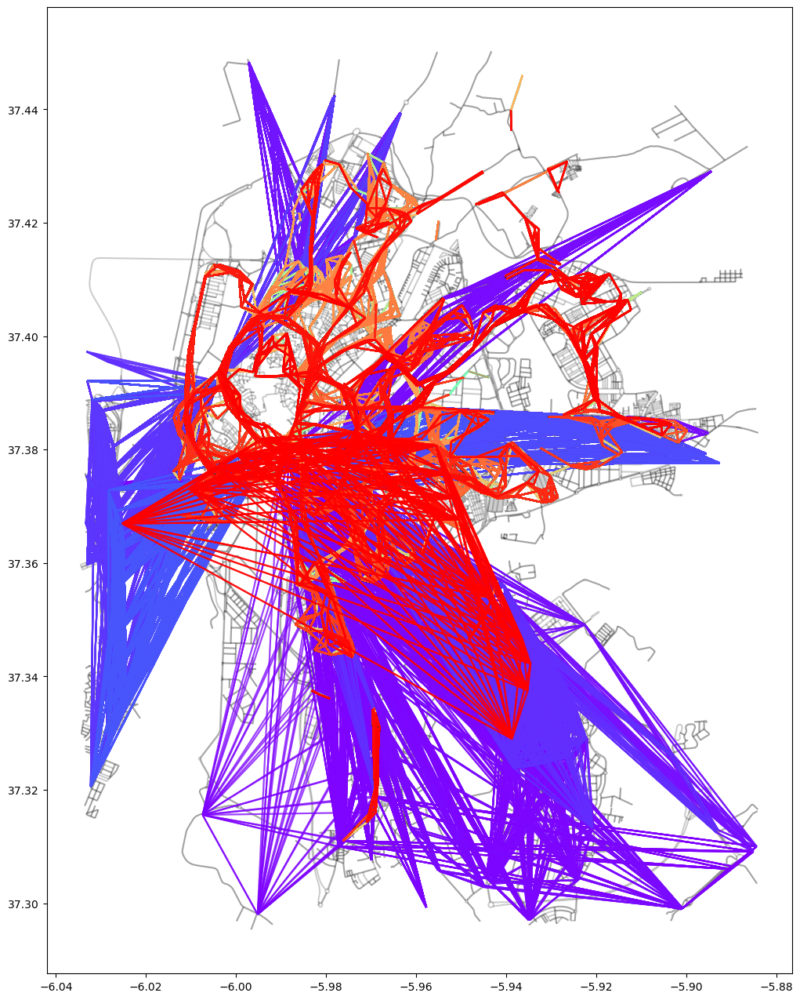

In [14]:
# Plot
model.pt_links.plot(column='trip_id', cmap='rainbow', alpha=.5, ax=model.auto_links.plot(color='black', alpha=.2, figsize=(figsize, figsize)))
plt.savefig('../output/'+region_name+'/pt_network.png', dpi=400, bbox_inches='tight')

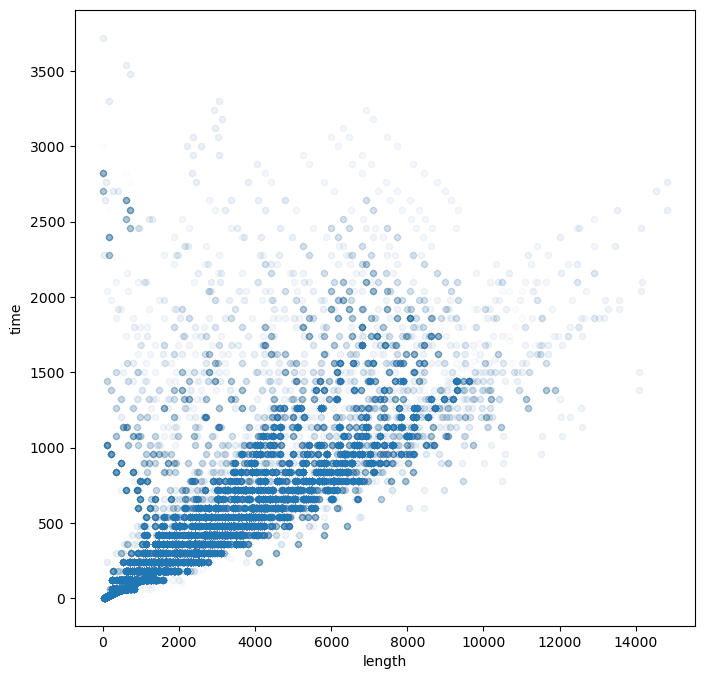

In [47]:
model.pt_links.plot.scatter(x='length', y='time', alpha=.01, figsize=(figsize/2, figsize/2))
plt.savefig('../output/'+region_name+'/pt_network_speeds.png', dpi=400, bbox_inches='tight')

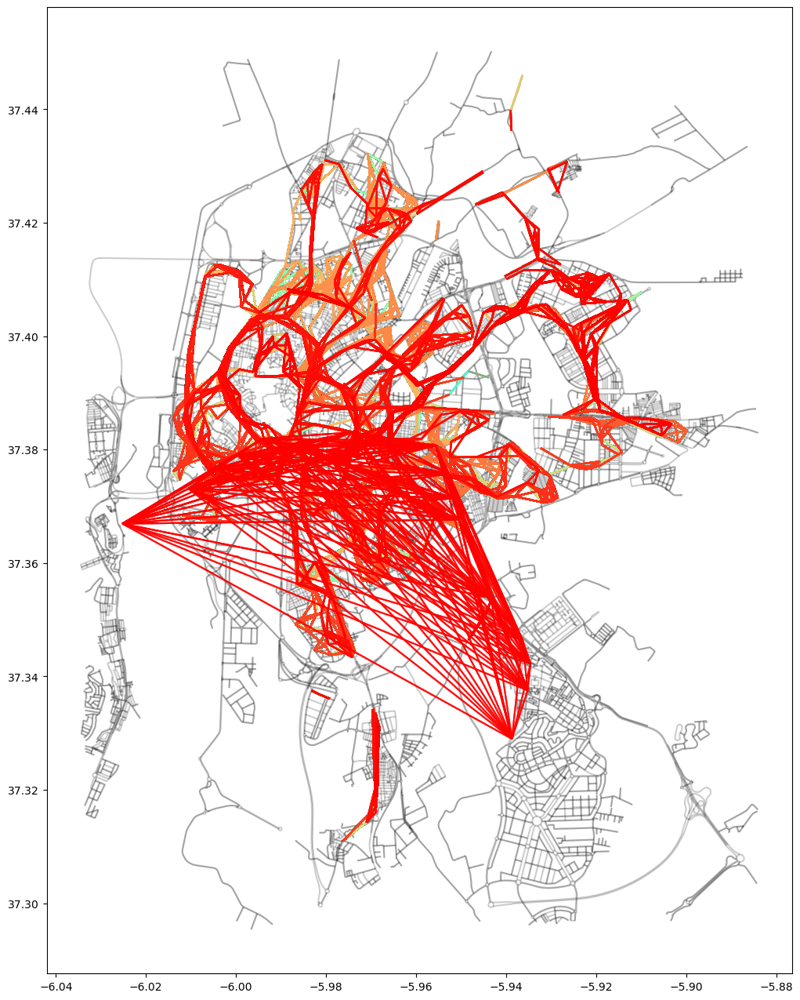

In [48]:
model.pt_links.loc[
    (~model.pt_links['trip_id'].str.startswith('1_'))
].plot(column='trip_id', cmap='rainbow', alpha=.5, ax=model.auto_links.plot(color='black', alpha=.2, figsize=(figsize, figsize)))
plt.savefig('../output/'+region_name+'/pt_network_clean.png', dpi=400, bbox_inches='tight')

# POI data

exctract relevant Points of Interest data from OpenStreetMap

In [58]:
poi_file = '../model/'+region_name+'/pois_raw.geojson'
if not os.path.exists(poi_file):
    # Load from OSM
    tags = {'office': True,
        'amenity': True,
        'leisure': True,
        'shop': True,
        #'tourism': True, # not really relevant for needs satisfaction of local population
        'craft': True,
        'healthcare': True,
        'landuse':['retail','commercial']}
    pois = []
    for tag, values in tags.items():
        poi = ox.features.features_from_polygon(polygon, tags={tag: values})
        poi['tag'] = tag
        poi['type'] = poi[tag]
        poi['area'] = poi.to_crs(3857)['geometry'].area
        poi['geometry'] = poi['geometry'].centroid
        pois.append(poi.reset_index()[['tag', 'type', 'name', 'osmid', 'geometry']])
    pois = pd.concat(pois).drop_duplicates('osmid').reset_index(drop=True)
    #pois = pois.loc[pois['geometry'].within(model.study_region_polygon)]
    # Save
    pois.to_file(poi_file, driver='GeoJSON')
else:
    pois = gpd.read_file(poi_file).to_crs(regio_df.crs)

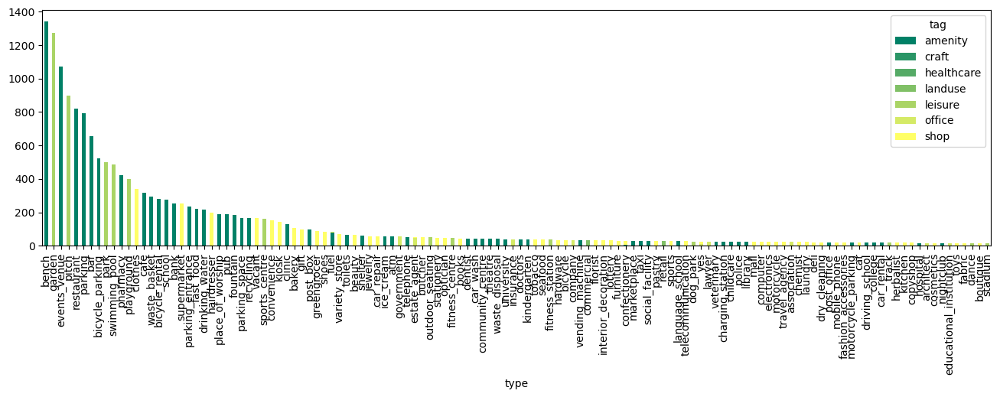

In [59]:
count = pois.groupby(['tag', 'type'])['osmid'].count().unstack(0).fillna(0)
count['sum'] = count.sum(axis=1)
count = count.sort_values('sum', ascending=False)
count.loc[count['sum']>=15].drop('sum', axis=1).plot.bar(stacked=True, cmap='summer', figsize=(figsize,figsize/4))
plt.savefig('../output/'+region_name+'/poi_frequency.png', dpi=400, bbox_inches='tight')

In [60]:
# Show those with low frequencies
str(count.loc[(count['sum']<15)&(count['sum']>1)].index.tolist())

"['research', 'pet', 'common', 'employment_agency', 'tailor', 'sports_hall', 'trade', 'antiques', 'builder', 'tattoo', 'art', 'photo', 'sewing', 'gambling', 'paint', 'perfumery', 'arts_centre', 'cinema', 'bed', 'diplomatic', 'pottery', 'luggage_locker', 'picnic_table', 'electrical', 'physiotherapist', 'medical_supply', 'car_parts', 'ngo', 'shoemaker', 'dressmaker', 'newsagent', 'department_store', 'hearing_aids', 'gardener', 'houseware', 'it', 'plumber', 'electronics_repair', 'hairdresser_supply', 'tea', 'doityourself', 'podiatrist', 'musical_instrument', 'music_school', 'craft', 'tax_advisor', 'ticket', 'vacuum_cleaner', 'bus_station', 'nursing_home', 'post_depot', 'biergarten', 'doors', 'fishing', 'food_court', 'watches', 'pawnbroker', 'wine', 'tyres', 'logistics', 'pet_grooming', 'window_construction', 'carpenter', 'curtain', 'property_management', 'motorcycle_repair', 'music', 'accountant', 'funeral_directors', 'garden_centre', 'advertising_agency', 'photographer', 'fire_station', 

In [61]:
# Assign POIs to trip purposes
purpose_desc = {
    '1': 'commuting',
    '2': 'education',
    '3': 'accompaniment',
    '41': 'social',
    '42': 'cultural',
    '51': 'groceries',
    '52': 'errands',
    '6': 'healthcare',
    '7': 'recreational'
}
purpose_pois = {
    '2': ['school', 'university', 'college', 'educational_institution'], # education
    '3': ['playground', 'kindergarten', 'childcare'], # accompaniment
    '41': ['restaurant', 'bar', 'cafe', 'pub', 'community_centre', 'social_facility', 'kitchen',
           'nightclub', 'nursing_home', 'biergarten', 'social_centre', 'social_club', 'townhall',
           'bowling_alley'], # social
    '42': ['events_venue', 'place_of_worship', 'theatre', 'dance', 'stadium', 'cinema', 'religion'], # cultural
    '51': ['supermarket', 'convenience', 'bakery', 'butcher', 'seafood', 'marketplace', 'grocery'], # groceries
    '52': ['pharmacy', 'variety_store', 'hardware', 'mall', 'laundry', 'post_office', 'copyshop',
           'department_store'], # errands
    '6': ['clinic', 'dentist', 'doctors', 'hospital'], # healthcare
    '7': ['garden', 'pitch', 'park', 'swimming_pool', 'sports_centre', 'outdoor_seating',
          'fitness_centre', 'fitness_station', 'sports', 'dog_park', 'library', 'track',
          'sports_hall', 'picnic_table', 'music_school', 'dojo', 'water_park', 'training',
          'yoga'], # recreational, outdoors
}
other = ['clothes', 'bank', 'fast_food', 'hairdresser', 'kiosk', 'gift', 'greengrocer', 'shoes',
         'fuel', 'beauty', 'jewelry', 'car_repair', 'ice_cream', 'government', 'estate_agent',
         'stationery', 'optician', 'car_wash', 'waste_disposal', 'insurance', 'tobacco', 'company',
         'commercial', 'florist', 'interior_decoration', 'lottery', 'furniture', 'confectionery',
         'taxi', 'pastry', 'retail', 'language_school', 'telecommunication', 'lawyer', 'veterinary',
         'police', 'books', 'computer', 'electronics', 'motorcycle', 'travel_agency', 'association',
         'chemist', 'deli', 'dry_cleaning', 'mobile_phone', 'fashion_accessories',
         'driving_school', 'car_rental', 'herbalist', 'architect', 'cosmetics', 'toys', 'fabric',
         'boutique', 'research', 'pet', 'common', 'employment_agency', 'tailor', 'trade', 'antiques',
         'builder', 'tattoo', 'art', 'photo', 'sewing', 'gambling', 'paint', 'perfumery', 'arts_centre',
         'diplomatic', 'pottery', 'electrical', 'physiotherapist', 'medical_supply', 'car_parts',
         'ngo', 'shoemaker', 'dressmaker', 'newsagent', 'hearing_aids', 'gardener', 'houseware', 'it',
         'plumber', 'electronics_repair', 'hairdresser_supply', 'tea', 'doityourself', 'podiatrist',
         'musical_instrument', 'craft', 'tax_advisor', 'vacuum_cleaner', 'doors', 'fishing', 'food_court',
         'watches', 'pawnbroker', 'wine', 'tyres', 'logistics', 'pet_grooming', 'window_construction',
         'carpenter', 'curtain', 'property_management', 'motorcycle_repair', 'music', 'accountant',
         'funeral_directors', 'garden_centre', 'advertising_agency', 'photographer', 'fire_station',
         'bookmaker', 'coffee', 'bag', 'bleachers', 'studio', 'glaziery', 'political_party', 'locksmith',
         'lighting', 'brewery', 'prep_school', 'leather', 'mobile_phone_accessories', 'general', 'games',
         'laboratory', 'printer_ink', 'frame', 'upholsterer', 'e-cigarette', 'massage', 'wholesale',
         'adult_gaming_centre', 'baby_goods', 'video_games', 'key_cutter', 'courthouse', 'escape_game',
         'security', 'state_agent', 'frozen_food', 'storage_rental', 'sauna', 'golf_course', 'handicraft',
         'health_food', 'coworking', 'hifi', 'travel_agent', 'charity', 'clockmaker', 'repair', 'rigger',
         'union', 'publisher', 'research_institute', 'psychotherapist', 'household_linen', 'party',
         'jeweller', 'anime', 'appliance', 'consulting', 'bookbinder', 'bureau_de_change', 'foundation',
         'financial_advisor', 'farm', 'casino', 'caterer', 'esoteric', 'erotic', 'centre', 'engineer',
         'energy_supplier', 'electrician', 'conference_centre', 'animal_boarding', 'guide', 'alcohol',
         'labor_union', 'monastery', 'money_transfer', 'newspaper', 'marina', 'notary', 'academy',
         'metal_construction']
commuting_pois = sum([l for p,l in purpose_pois.items() if p!= '7'], []) + other
purpose_pois['1'] = [] #commuting_pois
# Check for misspelling
for p, poi_list in purpose_pois.items():
    for poi in poi_list:
        assert len(pois.loc[pois['type']==poi])>0, 'POI not found: ' + poi

# Create separate file for commuting
commuting = pois.loc[pois['type'].isin(commuting_pois)].copy()

# Create columns for trip purposes
for purpose, values in purpose_pois.items():
    pois[purpose] = pois['type'].isin(values)
    commuting[purpose] = commuting['type'].isin(values)

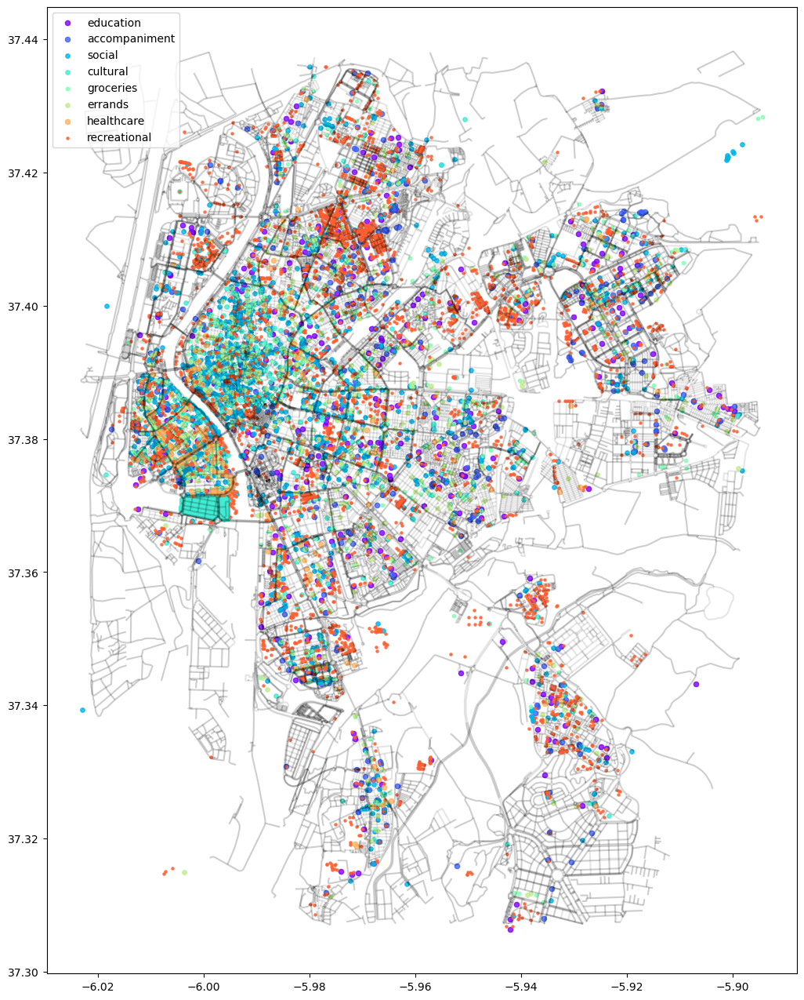

In [66]:
# Plot POI distribution
plot = model.walk_links.loc[model.walk_links['geometry'].within(model.study_region_polygon)
                            ].plot(color='black', alpha=0.1, figsize=(figsize,figsize))
colors = iter(cm.rainbow(np.linspace(0, 1, len(purpose_pois))))
sizes = {'1': 2, '2': 20, '3': 20, '41': 15, '42': 15, '51':10, '52': 15, '6': 20, '7': 5}
for purpose, values in purpose_pois.items():
    try:
        a = 0.4 if purpose=='1' else 0.8
        pois.loc[pois[purpose]].plot(markersize=sizes[purpose], color=next(colors), alpha=a, label=purpose_desc[purpose], ax=plot)
    except ValueError:
        pass
plot.legend()
plt.savefig('../output/'+region_name+'/pois.png', dpi=400, bbox_inches='tight')

In [67]:
# Create one activity column
pois['activity'] = 'nan'
for p, types in purpose_pois.items():
    pois.loc[pois[p], 'activity'] = p
    print(purpose_desc[p], len(pois.loc[pois[p]]))
commuting['activity'] = '1'
print(purpose_desc['1'], len(commuting))

education 351
accompaniment 463
social 2106
cultural 1345
groceries 633
errands 617
healthcare 229
recreational 3585
commuting 0
commuting 9385


In [68]:
len(pois.loc[pois['activity']!='nan'])

9329

# Residential housing

Get population distribution and locations of residential buildings

In [73]:
# Get population from GHSL
pop_url = 'https://cidportal.jrc.ec.europa.eu/ftp/jrc-opendata/GHSL/GHS_POP_MT_GLOBE_R2023A/GHS_POP_E2025_GLOBE_R2023A_54009_250/V1-0/tiles/GHS_POP_E2025_GLOBE_R2023A_54009_250_V1_0_13_11.zip'
#p = f"zip+{url}!GHS_POP_E2025_GLOBE_R2023A_54009_250_V1_0_13_11.tif"
p = '../input/GHS_POP_E2025_GLOBE_R2023A_54009_100_V1_0/GHS_POP_E2025_GLOBE_R2023A_54009_100_V1_0.tif'
ghsl_pop = rxr.open_rasterio(p, masked=True, chunks={"x": 2048, "y": 2048})
ghsl_pop = ghsl_pop.rio.clip(regio_df.to_crs(ghsl_pop.rio.crs).geometry, from_disk=True)

In [74]:
# Use population cell centroids as residential housing
pop = ghsl_pop.compute()
residential = gpd.GeoDataFrame.from_features(
    [{"properties": {"pop": v}, "geometry": s} for i, (s, v) in enumerate(
        shapes(pop.values, mask=~pop.isnull().values, transform=pop.rio.transform()))
    ],
    crs=pop.rio.crs)
residential = residential.loc[residential['pop']>0]
residential.geometry = residential.centroid
residential = residential.to_crs(regio_df.crs)
len(residential)

39335

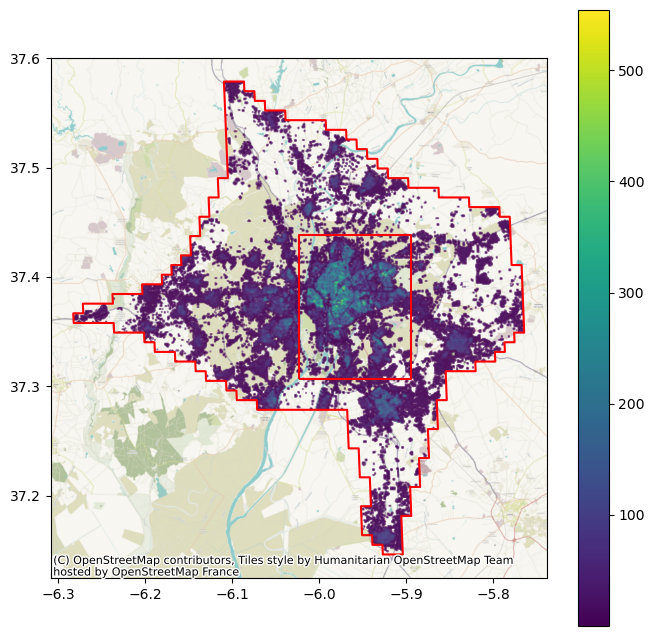

In [75]:
plot = residential.plot(column='pop', alpha=.5, markersize=.3, legend=True, figsize=(figsize/2, figsize/2))
plot = regio_df.boundary.plot(color='red', ax=plot)
cx.add_basemap(ax=plot, crs=residential.crs, zoom=13)#, source=cx.providers.OpenStreetMap.Mapnik)
plot.figure.savefig('../output/'+region_name+'/population_density.png', dpi=400, bbox_inches='tight')

# Cluster POIs

Cluster population and POIs into useful zones for fast computation

C:\Users\m.arnz\AppData\Local\Temp\ipykernel_54596\791619370.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  clusters['centroid'] = clusters.centroid
C:\Users\m.arnz\AppData\Local\miniforge-pypy3\envs\quetzal\Lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Number of origin zones: 95


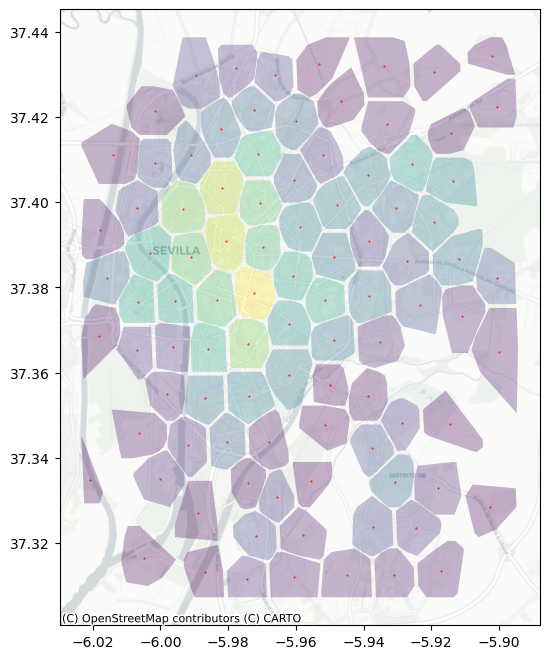

In [76]:
# Clip origins to region of analysis
o = residential.loc[residential['geometry'].apply(lambda g: g.within(polygon))]

# Now cluster into zones
clusters, cluster_series = zone_clusters(o, n_clusters=100)
clusters = gpd.GeoDataFrame(clusters).set_crs(regio_df.crs)
clusters['centroid'] = clusters.centroid
clusters['cluster'] = clusters.index.map(lambda i: str(i)+'_home')
if 'pop' in o.columns:
    o['cluster'] = cluster_series
    o_pop = o.groupby('cluster')['pop'].sum()
    clusters['pop'] = o_pop
    clusters = clusters.loc[clusters['pop']>200]
    print('Number of origin zones:', len(clusters))
else:
    clusters['pop'] = 1
o = clusters[['cluster', 'centroid', 'pop']].rename(
    columns={'cluster':'origin_id', 'centroid':'origin', 'pop': 'dest_weight'}
).copy()
o['activity'] = '0'
# Save for later results analysis
clusters.reset_index(drop=True).drop('centroid', axis=1)\
    .to_file('../model/'+region_name+'/zones.geojson', driver='GeoJSON')
# plot
plot = clusters.plot(column='pop', alpha=.3, legend=False, figsize=(figsize/2, figsize/2))
plot = o['origin'].plot(color='red', markersize=.2, ax=plot)
cx.add_basemap(ax=plot, crs=residential.crs, zoom=13, source=cx.providers.CartoDB.Positron)
plot.figure.savefig('../output/'+region_name+'/clustered_zones.png', dpi=400, bbox_inches='tight')

Number of commuting clusters 141


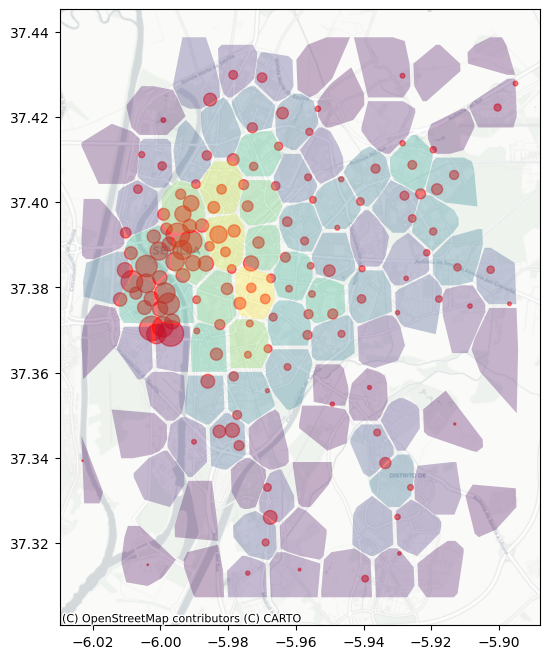

In [77]:
# Cluster commuting zones agglomeratively
work = commuting.copy().to_crs(epsg=3857)
work['cluster'] = agglomerative_clustering(work, distance_threshold=3500)
work['cluster'] = work['cluster'].apply(lambda i: str(i)+'_work')
work_count = work.groupby('cluster')['type'].count()
work = work.groupby('cluster').apply(lambda g: g['geometry'].union_all().centroid).to_frame()
work['size'] = work_count
work = gpd.GeoDataFrame(work).set_geometry(0).set_crs(epsg=3857).to_crs(epsg=4326).reset_index()
work = work[['cluster', 0, 'size']].rename(columns={'cluster':'origin_id', 0:'origin', 'size':'dest_weight'}).drop_duplicates()
work['activity'] = '1'
print('Number of commuting clusters', len(work))
# plot
plot = work['origin'].plot(color='red', markersize=work_count, alpha=.5, figsize=(figsize/2, figsize/2))
plot = clusters.plot(column='pop', alpha=.3, legend=False, ax=plot)
cx.add_basemap(ax=plot, crs=residential.crs, zoom=13, source=cx.providers.CartoDB.Positron)
plot.figure.savefig('../output/'+region_name+'/work_clustered_zones.png', dpi=400, bbox_inches='tight')

Number of education clusters 230
Number of accompaniment clusters 231
Number of social clusters 155
Number of cultural clusters 108
Number of groceries clusters 212
Number of errands clusters 247
Number of healthcare clusters 139
Number of recreational clusters 169


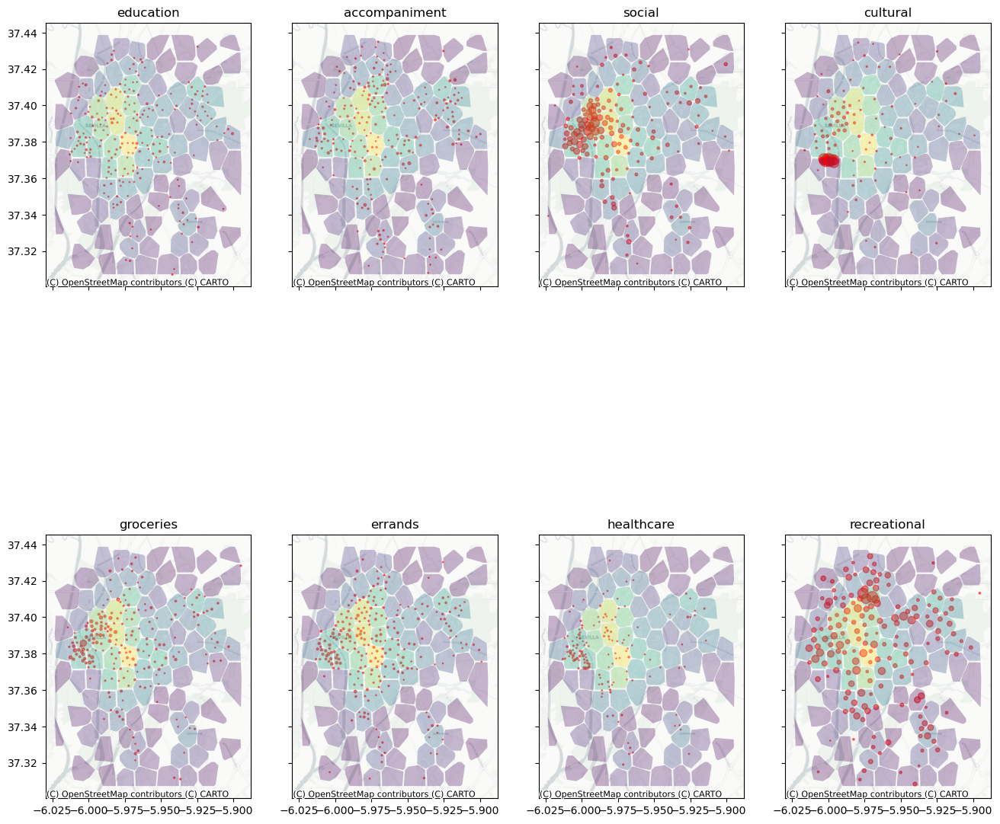

In [78]:
# Cluster other POIs agglomeratively
poi_zones = {}
for i, (p, name) in enumerate(purpose_desc.items()):
    if len(pois.loc[pois['activity']==p]) > 1:
        df = pois.loc[pois[p]].copy().to_crs(epsg=3857)
        df['cluster'] = agglomerative_clustering(df, distance_threshold=len(df)/2+100)
        df['cluster'] = df['cluster'].apply(lambda i: str(i)+'_'+name)
        count = df.groupby('cluster')['type'].count()
        df = df.groupby('cluster').apply(lambda g: g['geometry'].union_all().centroid).to_frame()
        df['size'] = count
        df = gpd.GeoDataFrame(df).set_geometry(0).set_crs(epsg=3857).to_crs(epsg=4326).reset_index()
        df = df[['cluster', 0, 'size']].rename(columns={'cluster':'origin_id', 0:'origin', 'size':'dest_weight'}).drop_duplicates()
        df['activity'] = p
        print(f'Number of {name} clusters', len(df))
        poi_zones[p] = df

# plot
fig, axs = plt.subplots(2, int(round(len(poi_zones)/2)), figsize=(figsize, figsize), sharex='all', sharey='all')
for ax, p, df in zip(axs.flat, poi_zones.keys(), poi_zones.values()):
    ax.set_title(purpose_desc[p])
    df['origin'].plot(color='red', markersize=df['dest_weight'], alpha=.5, ax=ax)
    clusters.plot(column='pop', alpha=.3, legend=False, ax=ax)
    cx.add_basemap(ax=ax, crs=residential.crs, zoom=13, source=cx.providers.CartoDB.Positron)
plt.savefig('../output/'+region_name+'/pois_clustered_zones.png', dpi=400, bbox_inches='tight')

In [86]:
# Save POIs
merged = pd.concat([work]+list(poi_zones.values()))
merged['geometry'] = merged['origin']
merged = gpd.GeoDataFrame(merged.drop('origin', axis=1)).set_crs(regio_df.crs)
merged.to_file('../model/'+region_name+'/pois.geojson', driver='GeoJSON')